In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassAccuracy

from torchvision.models import resnet101

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir)])
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image'].float()
            mask = augmented['mask'].long()

        return image, mask.long()

In [ ]:
def get_transforms():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.ElasticTransform(p=0.3),      
        A.GridDistortion(p=0.3),       
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])


train_dataset = SegmentationDataset(
    image_dir='/kaggle/input/spinach-leaf-area/spinach/images/train',
    mask_dir='/kaggle/input/spinach-leaf-area/spinach/masks/train',
    transform=get_transforms()
)

val_dataset = SegmentationDataset(
    image_dir='/kaggle/input/spinach-leaf-area/spinach/images/val',
    mask_dir='/kaggle/input/spinach-leaf-area/spinach/masks/val',
    transform=get_transforms()
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4)

In [4]:
class AtrousConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, atrous_rate):
        super().__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=atrous_rate, dilation=atrous_rate, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = self.relu(self.bn(self.conv(x)))    
        return x
    

class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.5):
        super().__init__()
        
        # 1x1 Conv
        self.branch1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
        
        # 3x3 Conv with different atrous rate
        self.branch2 = AtrousConvBlock(in_channels, out_channels, atrous_rate=6)
        self.branch3 = AtrousConvBlock(in_channels, out_channels, atrous_rate=12)
        self.branch4 = AtrousConvBlock(in_channels, out_channels, atrous_rate=18)
        
        # Global AVG Pooling
        self.gap = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
        
        # Conv out
        self.conv_out = nn.Sequential(
            nn.Conv2d(out_channels * 5, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout(dropout)
        )
        
    def forward(self, x):
        size = x.shape[2:]
        
        out1 = self.branch1(x)
        out2 = self.branch2(x)
        out3 = self.branch3(x)
        out4 = self.branch4(x)
        
        # Temporarily switch GAP branch to eval mode
        self.gap.eval()  # <- this line fixes the issue
        with torch.no_grad():
            out5 = self.gap(x)
        out5 = F.interpolate(out5, size=size, mode='bilinear', align_corners=True)        
        
        merged = torch.cat([out1, out2, out3, out4, out5], dim=1)
        return self.conv_out(merged)
    
    
class DeepLabV3Decoder(nn.Module):
    def __init__(self, low_level_in_channels, aspp_out_channels, num_classes):
        super().__init__()
        
        # Low level features reducer
        self.low_level_reduce = nn.Sequential(
            nn.Conv2d(low_level_in_channels, 48, 1, bias=False),
            nn.BatchNorm2d(48),
            nn.ReLU()
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(48 + aspp_out_channels, 256, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, num_classes, 1)
        )
        
    def forward(self, aspp_out, low_level_features):
        low_level_features = self.low_level_reduce(low_level_features)
        aspp_out = F.interpolate(aspp_out, size=low_level_features.shape[2:], mode='bilinear', align_corners=True)
        merged = torch.cat([low_level_features, aspp_out], dim=1)
        return self.decoder(merged)
    

class ResNetBackbone(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        
        resnet = resnet101(pretrained)
        self.low_level_channels = 256
        self.high_level_channels = 2048
        
        self.layer0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool)
        self.layer1 = resnet.layer1
        self.layer2 = resnet.layer2
        self.layer3 = resnet.layer3
        self.layer4 = resnet.layer4
        
        # Modify last stage with atrous conv
        for n, m in self.layer4.named_modules():
            if 'conv2' in n:
                m.dilation, m.padding, m.stride = (2, 2), (2, 2), (1, 1)
            elif 'downsample.0' in n:
                m.stride = (1, 1)
                
    def forward(self, x):
        x = self.layer0(x)
        low_level = self.layer1(x)
        high_level = self.layer2(low_level)
        high_level = self.layer3(high_level)
        high_level = self.layer4(high_level)
        
        return high_level, low_level
    
    
class DeepLabV3Plus(nn.Module):
    def __init__(self, in_channels=1, num_classes=3):
        super().__init__()
        
        self.backbone = ResNetBackbone(pretrained=True)
        self.aspp = ASPP(self.backbone.high_level_channels, 256)
        self.decoder = DeepLabV3Decoder(self.backbone.low_level_channels, 256, num_classes)
        
    def forward(self, x):
        size = x.shape[2:]
        high_level_features, low_level_features = self.backbone(x)
        aspp_out = self.aspp(high_level_features)
        decoder_out = self.decoder(aspp_out, low_level_features)
        out = F.interpolate(decoder_out, size=size, mode='bilinear', align_corners=True)
        
        return out


model = DeepLabV3Plus(3, 3)
input = torch.rand((1, 3, 640, 640))
model(input).shape

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 218MB/s] 


torch.Size([1, 3, 640, 640])

In [ ]:
from torchinfo import summary

summary(model, input_size=(4, 3, 640, 640))

Layer (type:depth-idx)                        Output Shape              Param #
DeepLabV3Plus                                 [4, 3, 640, 640]          --
├─ResNetBackbone: 1-1                         [4, 2048, 40, 40]         --
│    └─Sequential: 2-1                        [4, 64, 160, 160]         --
│    │    └─Conv2d: 3-1                       [4, 64, 320, 320]         9,408
│    │    └─BatchNorm2d: 3-2                  [4, 64, 320, 320]         128
│    │    └─ReLU: 3-3                         [4, 64, 320, 320]         --
│    │    └─MaxPool2d: 3-4                    [4, 64, 160, 160]         --
│    └─Sequential: 2-2                        [4, 256, 160, 160]        --
│    │    └─Bottleneck: 3-5                   [4, 256, 160, 160]        75,008
│    │    └─Bottleneck: 3-6                   [4, 256, 160, 160]        70,400
│    │    └─Bottleneck: 3-7                   [4, 256, 160, 160]        70,400
│    └─Sequential: 2-3                        [4, 512, 80, 80]          --
│   

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
#############################################################
class_weights = torch.tensor([0.1, 1.0, 5.0]).to(device)

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-5, from_logits=True, ignore_index=None):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        self.from_logits = from_logits
        self.ignore_index = ignore_index

    def forward(self, inputs, targets):
        if self.from_logits:
            inputs = F.softmax(inputs, dim=1)

        num_classes = inputs.shape[1]

        # Mask out ignore_index pixels
        if self.ignore_index is not None:
            mask = targets != self.ignore_index
            targets = targets * mask
        else:
            mask = torch.ones_like(targets, dtype=torch.bool)

        # One-hot encode targets
        targets_onehot = F.one_hot(targets, num_classes).permute(0, 3, 1, 2).float()

        inputs = inputs * mask.unsqueeze(1)
        targets_onehot = targets_onehot * mask.unsqueeze(1)

        inputs_flat = inputs.contiguous().view(inputs.shape[0], inputs.shape[1], -1)
        targets_flat = targets_onehot.contiguous().view(targets_onehot.shape[0], targets_onehot.shape[1], -1)

        intersection = (inputs_flat * targets_flat).sum(-1)
        union = inputs_flat.sum(-1) + targets_flat.sum(-1)

        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        loss = 1 - dice.mean()

        return loss

dice = DiceLoss(from_logits=True)
ce = nn.CrossEntropyLoss(weight=class_weights)

def combined_loss(pred, target):
    return 0.5 * dice(pred, target) + 0.5 * ce(pred, target)

#############################################################

criterion = combined_loss
optimizer = optim.Adam(model.parameters(), lr=1e-4)

#############################################################


def train_model(model, loader, criterion, optimizer, device):
    model.train()
    epoch_loss = 0
    for x, y in tqdm(loader, desc='\tTraining: '):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    return epoch_loss / len(loader)

def eval_model(model, loader, criterion):
    model.eval()
    epoch_loss = 0
    with torch.no_grad():
        for x, y in tqdm(loader, desc='\tEvaluating: '):
            x, y = x.to(device), y.to(device)
            out = model(x)
            loss = criterion(out, y)
            epoch_loss += loss.item()
    return epoch_loss / len(loader)

iou_metric = MulticlassJaccardIndex(num_classes=3).to(device)
acc_metric = MulticlassAccuracy(num_classes=3, average='weighted').to(device)

def evaluate_metrics(model, loader):
    model.eval()
    iou_metric.reset()
    acc_metric.reset()
    with torch.no_grad():
        for x, y in tqdm(loader, desc='\tEval metrics'):
            x, y = x.to(device), y.to(device)
            out = model(x)
            pred = torch.argmax(out, dim=1)
            iou_metric.update(pred, y)
            acc_metric.update(pred, y)
    iou = iou_metric.compute().cpu().numpy()
    acc = acc_metric.compute().item()
    return iou, acc

#############################################################

epochs = 10
train_losses, train_ious, train_accs = [], [], []
val_losses, val_ious, val_accs = [], [], []
for epoch in range(epochs):
    print(f"[Epoch {epoch + 1}]")
    train_loss = train_model(model, train_loader, criterion, optimizer, device)
    val_loss = eval_model(model, val_loader, criterion)
    train_iou, train_acc = evaluate_metrics(model, train_loader)
    val_iou, val_acc = evaluate_metrics(model, val_loader)
    
    train_losses.append(train_loss)
    train_ious.append(train_iou)
    train_accs.append(train_acc)
    val_losses.append(val_loss)
    val_ious.append(val_iou)
    val_accs.append(val_acc)
    
    print(f"\t-> Train Loss: {train_loss:.4f}, mIoU: {train_iou.mean():.4f}, Acc: {train_acc:.4f}")
    print(f"\t-> Val Loss: {val_loss:.4f}, mIoU: {val_iou.mean():.4f}, Acc: {val_acc:.4f}")
    print('#################################################################')

[Epoch 1]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.16it/s]


	-> Train Loss: 0.3494, mIoU: 0.7137, Acc: 0.9404
	-> Val Loss: 0.2750, mIoU: 0.7201, Acc: 0.9437
#################################################################
[Epoch 2]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


	-> Train Loss: 0.2374, mIoU: 0.7915, Acc: 0.9549
	-> Val Loss: 0.1948, mIoU: 0.7922, Acc: 0.9561
#################################################################
[Epoch 3]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.16it/s]


	-> Train Loss: 0.1676, mIoU: 0.8517, Acc: 0.9602
	-> Val Loss: 0.1259, mIoU: 0.8465, Acc: 0.9607
#################################################################
[Epoch 4]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.02it/s]


	-> Train Loss: 0.1140, mIoU: 0.8896, Acc: 0.9714
	-> Val Loss: 0.1023, mIoU: 0.8799, Acc: 0.9723
#################################################################
[Epoch 5]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.12it/s]


	-> Train Loss: 0.0838, mIoU: 0.9130, Acc: 0.9777
	-> Val Loss: 0.0779, mIoU: 0.9133, Acc: 0.9778
#################################################################
[Epoch 6]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.23it/s]


	-> Train Loss: 0.0657, mIoU: 0.9232, Acc: 0.9769
	-> Val Loss: 0.0629, mIoU: 0.9183, Acc: 0.9767
#################################################################
[Epoch 7]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


	-> Train Loss: 0.0598, mIoU: 0.9224, Acc: 0.9766
	-> Val Loss: 0.0561, mIoU: 0.9163, Acc: 0.9758
#################################################################
[Epoch 8]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


	-> Train Loss: 0.0519, mIoU: 0.9295, Acc: 0.9790
	-> Val Loss: 0.0539, mIoU: 0.9221, Acc: 0.9783
#################################################################
[Epoch 9]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


	-> Train Loss: 0.0478, mIoU: 0.9286, Acc: 0.9803
	-> Val Loss: 0.0522, mIoU: 0.9242, Acc: 0.9795
#################################################################
[Epoch 10]


	Eval metrics: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s]

	-> Train Loss: 0.0578, mIoU: 0.9236, Acc: 0.9753
	-> Val Loss: 0.0543, mIoU: 0.9202, Acc: 0.9759
#################################################################


In [7]:
torch.save(model.state_dict(), 'best_model.pth')

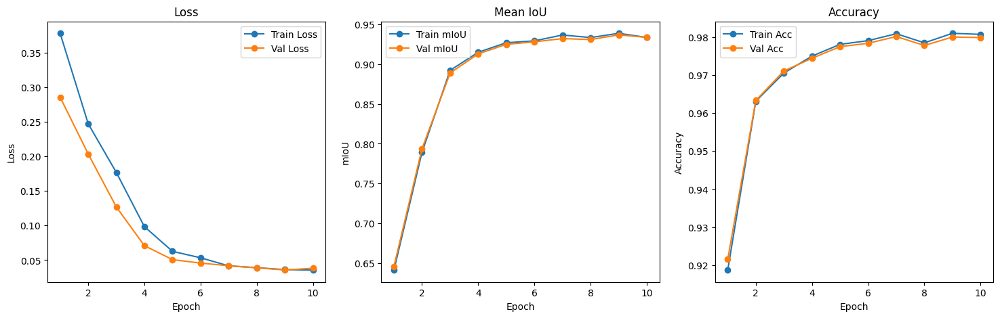

In [ ]:
def visualize_train_process(train_losses, train_ious, train_accs, val_losses, val_ious, val_accs, save_path=None):
    """
    Plots the training and validation loss, mIoU, and accuracy over epochs.
    """
    epochs = list(range(1, len(train_losses) + 1))
    # Compute mean IoU per epoch
    train_iou_means = [iou.mean() for iou in train_ious]
    val_iou_means   = [iou.mean() for iou in val_ious]

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Loss plot
    axes[0].plot(epochs, train_losses, '-o', label='Train Loss')
    axes[0].plot(epochs, val_losses,   '-o', label='Val Loss')
    axes[0].set_title('Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # mIoU plot
    axes[1].plot(epochs, train_iou_means, '-o', label='Train mIoU')
    axes[1].plot(epochs, val_iou_means,   '-o', label='Val mIoU')
    axes[1].set_title('Mean IoU')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('mIoU')
    axes[1].legend()

    # Accuracy plot
    axes[2].plot(epochs, train_accs, '-o', label='Train Acc')
    axes[2].plot(epochs, val_accs,   '-o', label='Val Acc')
    axes[2].set_title('Accuracy')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Accuracy')
    axes[2].legend()
    
    # Save
    if save_path:
        pass

visualize_train_process(train_losses, train_ious, train_accs, val_losses, val_ious, val_accs)

In [9]:
# def visualize_prediction(model, dataset, idx=0):
#     model.eval()
#     image, true_mask = dataset[idx]
#     with torch.no_grad():
#         pred_mask = model(image.unsqueeze(0).to(device))
#         pred_mask = torch.argmax(pred_mask.squeeze(), dim=0).cpu().numpy()

#     image_np = image.permute(1, 2, 0).numpy()
#     true_mask = true_mask.numpy()
#     print(image_np.shape)

#     fig, axs = plt.subplots(1, 3, figsize=(12, 4))
#     axs[0].imshow(image_np)
#     axs[0].set_title("Image")
#     axs[1].imshow(true_mask, cmap='nipy_spectral')
#     axs[1].set_title("Ground Truth")
#     axs[2].imshow(pred_mask, cmap='nipy_spectral')
#     axs[2].set_title("Prediction")
#     for ax in axs:
#         ax.axis('off')
#     plt.tight_layout()
#     plt.show()

# visualize_prediction(model, train_dataset, idx=1)

In [13]:
def visualize_prediction(model, dataset, idx=0):
    model.to(device)
    image = cv2.imread(dataset.image_paths[idx])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    true_mask = cv2.imread(dataset.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

    image_in = torch.Tensor(image).float().permute(2, 0, 1)
    model.eval()
    with torch.no_grad():
        pred_mask = model(image_in.unsqueeze(0).to(device))
        pred_mask = torch.argmax(pred_mask.squeeze(), dim=0).cpu().numpy()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image)
    axs[0].set_title("Image")
    axs[1].imshow(true_mask, cmap='nipy_spectral')
    axs[1].set_title("Ground Truth")
    axs[2].imshow(pred_mask, cmap='nipy_spectral')
    axs[2].set_title("Prediction")
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
loaded_model = DeepLabV3Plus(
    in_channels=3,
    classes=3
)
# model = nn.DataParallel(model)

loaded_model.load_state_dict(torch.load('best_model.pth', weights_only=True))

<All keys matched successfully>

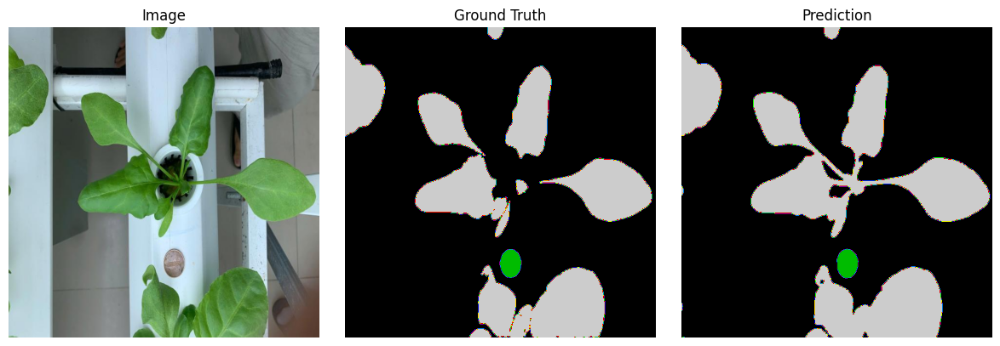

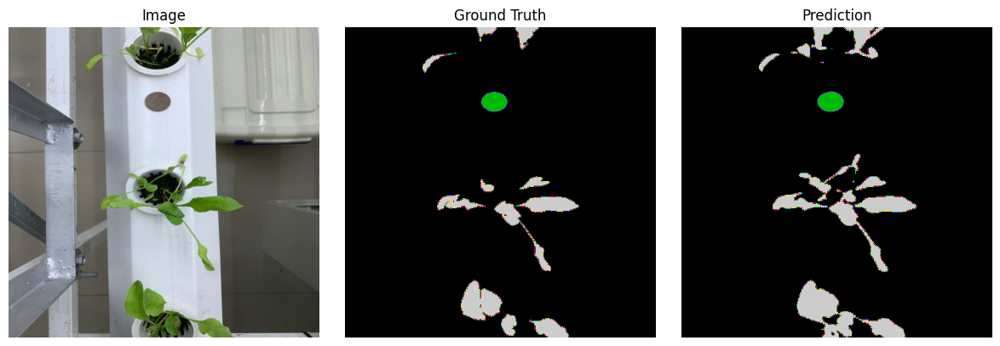

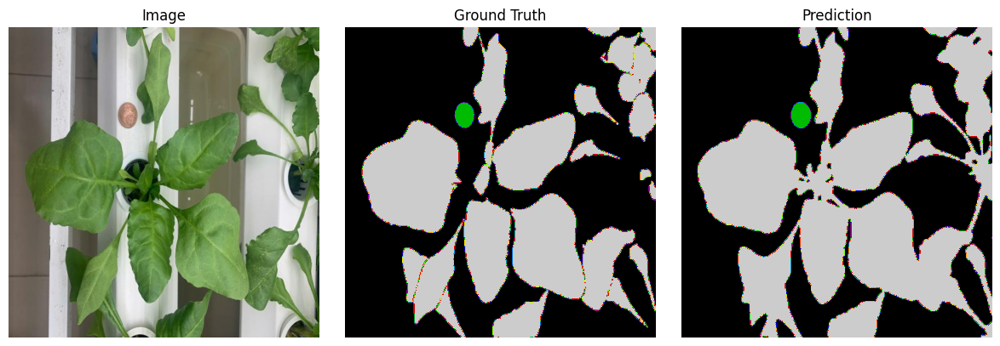

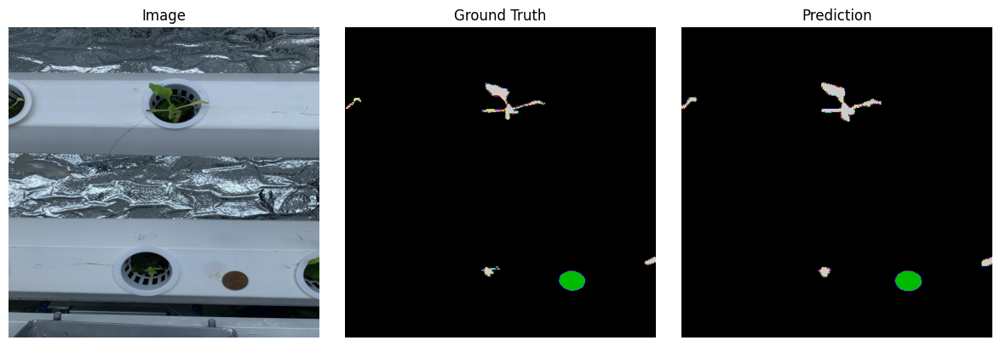

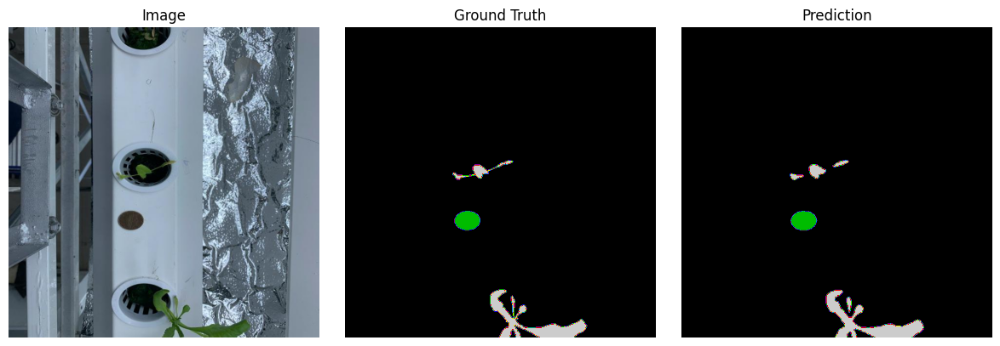

...

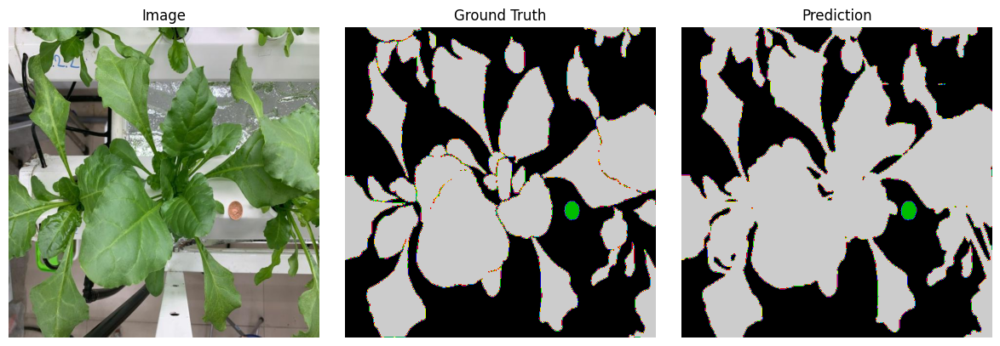

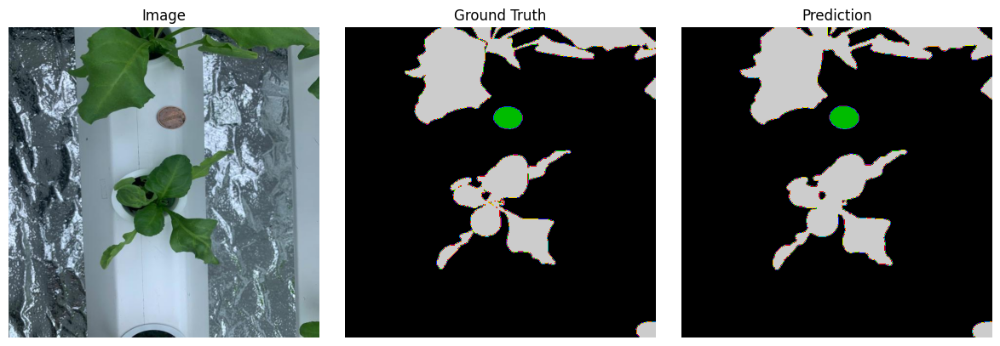

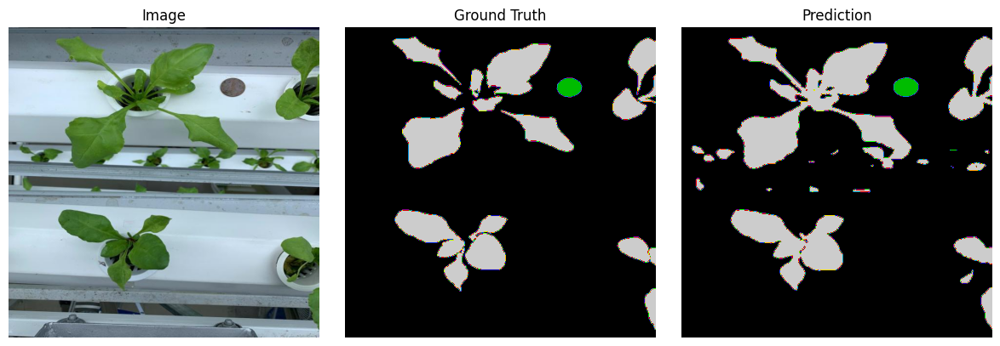

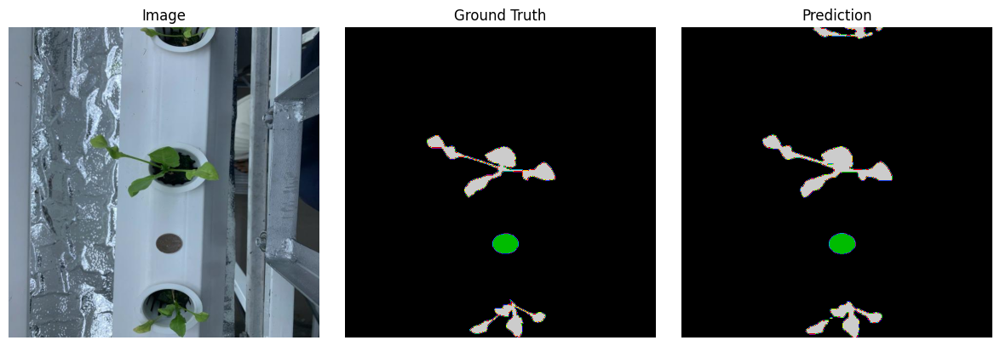

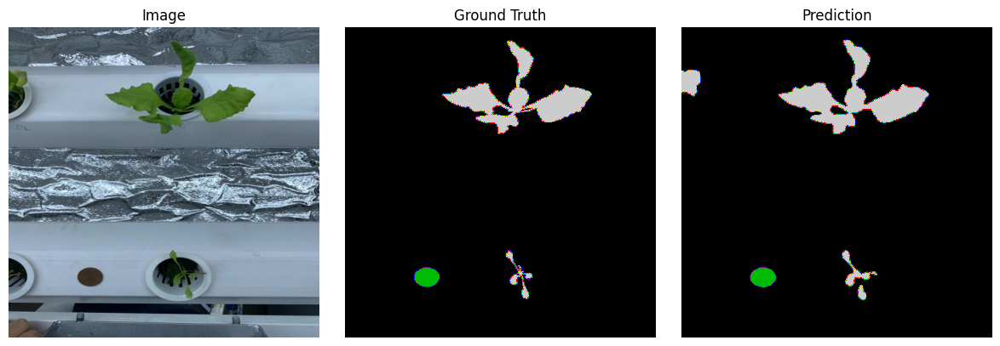

In [15]:
for i in range(len(val_dataset)):
    visualize_prediction(loaded_model, val_dataset, i)

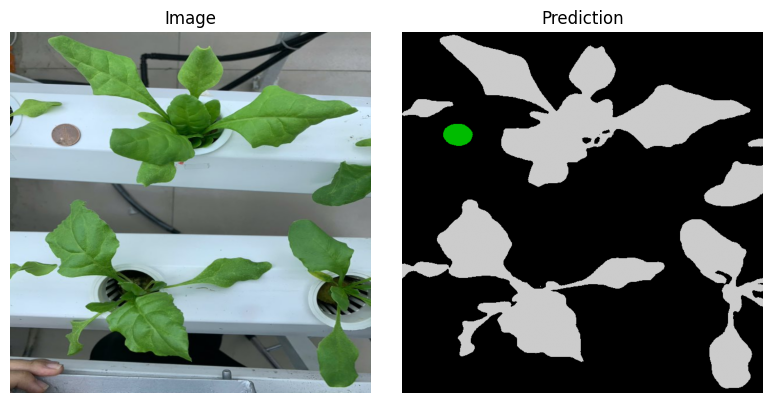

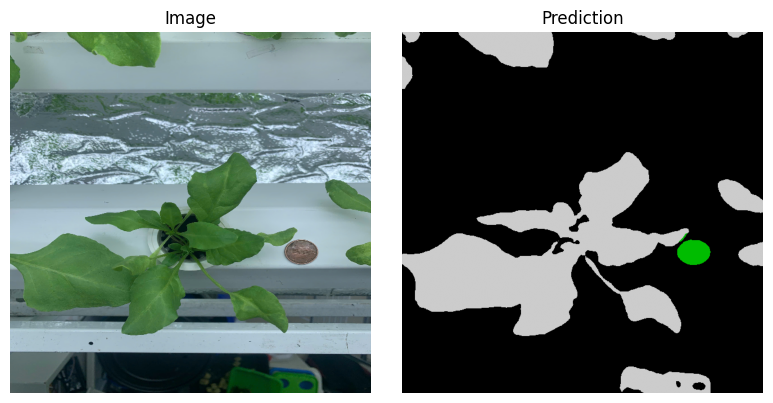

In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def visualize_segmentation(model, image_path):
    model.to(device)
    image = cv2.imread(image_path)
    image = cv2.resize(image, (640, 640))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_in = torch.Tensor(image).float().permute(2, 0, 1)
    model.eval()
    with torch.no_grad():
        pred_mask = model(image_in.unsqueeze(0).to(device))
        pred_mask = torch.argmax(pred_mask.squeeze(), dim=0).cpu().numpy()

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(image)
    axs[0].set_title("Image")
    axs[1].imshow(pred_mask, cmap='nipy_spectral')
    axs[1].set_title("Prediction")
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

visualize_segmentation(loaded_model, 'im1.jpg')
visualize_segmentation(loaded_model, 'im2.jpg')